In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df=pd.read_csv("../../Datasets/imagetrain.csv/imagetrain.csv")
# each row of this data set contains values of 28*28 pixel handwritten image 
df.shape

(42000, 785)

In [3]:
df.tail()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
41995,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41996,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41997,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41998,6,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41999,9,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


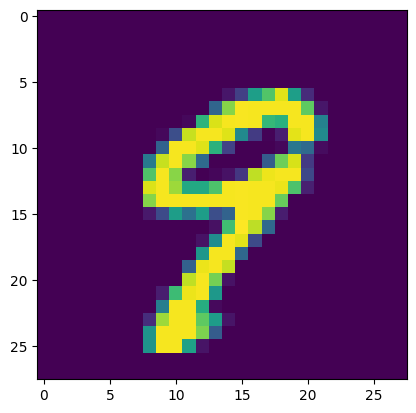

In [4]:
plt.imshow(df.iloc[11,1:].values.reshape(28,28))

In [5]:
from sklearn.model_selection import train_test_split

X_train,X_test,Y_train,Y_test=train_test_split(df.iloc[:,1:],df["label"],test_size=0.25)


In [6]:
from sklearn.decomposition import PCA

pca=PCA(n_components=20)

X_train_trans=pca.fit_transform(X_train)
X_test_trans=pca.transform(X_test)

In [7]:
X_train_trans.shape

(31500, 20)

In [8]:
# here i am creating a model and checking accuracy as dimensions changes
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

In [9]:
for i in range(1,785):
    knn=KNeighborsClassifier()
    X_train,X_test,Y_train,Y_test=train_test_split(df.iloc[:,1:],df["label"],test_size=0.25)
    
    pca=PCA(n_components=i)
    
    X_train_trans=pca.fit_transform(X_train)
    X_test_trans=pca.transform(X_test)
    knn.fit(X_train,Y_train)
    Y_pred=knn.predict(X_test)
    acc=accuracy_score(Y_test,Y_pred)
    print(acc*100)

KeyboardInterrupt: 

# Visualsing

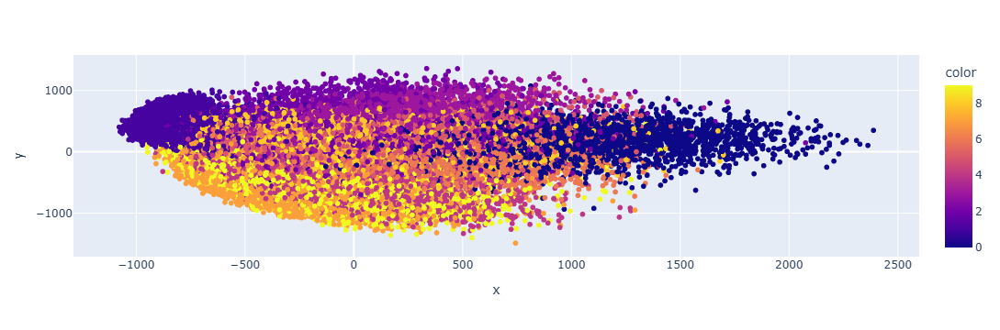

In [10]:
# in 2d
from sklearn.model_selection import train_test_split

X_train,X_test,Y_train,Y_test=train_test_split(df.iloc[:,1:],df["label"],test_size=0.25)
pca=PCA(n_components=2)
X_train_trans=pca.fit_transform(X_train)
X_test_trans=pca.transform(X_test)

import plotly.express as px
px.scatter(x=X_train_trans[:,0],y=X_train_trans[:,1],color=Y_train)

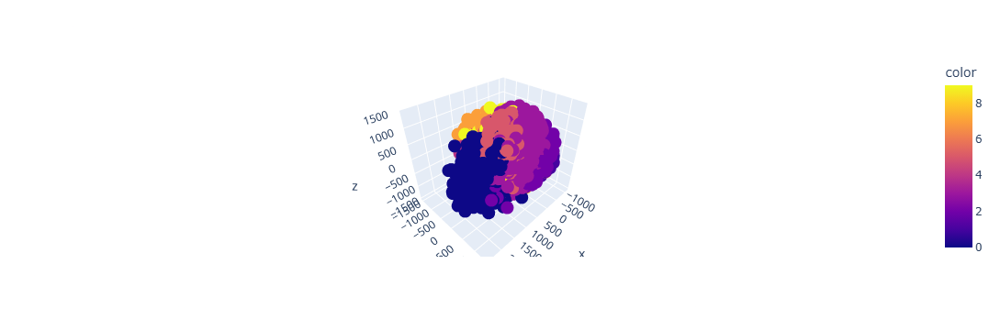

In [11]:
pca=PCA(n_components=3)
X_train_trans=pca.fit_transform(X_train)
X_test_trans=pca.transform(X_test)
import plotly.express as px
px.scatter_3d(x=X_train_trans[:,0],y=X_train_trans[:,1],z=X_train_trans[:,2],color=Y_train)

In [13]:
pca.explained_variance_

# pca has calculated 784 eigen values here it returns 3 top beacuse n_components is 3

array([335921.19443002, 245136.18492098, 212079.99687254])

In [15]:
pca.components_

# pca has calculated 784 eigen vectors here it returns 3 top vectors each of dimension 1*784  beacuse n_components is 3

array([[-0., -0., -0., ..., -0., -0., -0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [-0., -0., -0., ..., -0., -0., -0.]])

In [18]:
# finding optimum no of principal component required

# each eigen value explain a particular percentage of variance which can be calculated by formula

#  %=(lamda(i)/sum of all eigen values) * 100

# generally we need to cover 90,95% if variance so we take that many eigen values whose percentage sum cross that no

pca.explained_variance_ratio_*100  # it gives the value mentioned above

array([9.77885029, 7.13604885, 6.17376508])

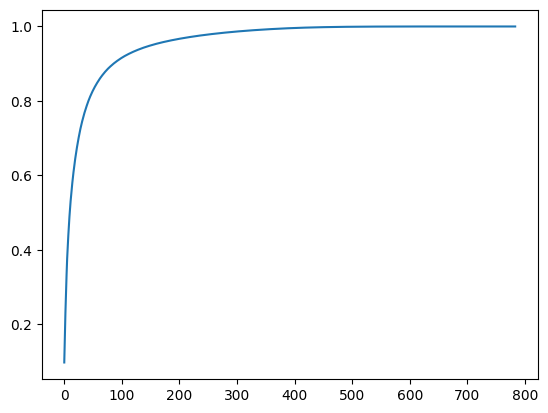

In [19]:
pca=PCA(n_components=None)  #it will take all features
X_train_trans=pca.fit_transform(X_train)

a=np.cumsum(pca.explained_variance_ratio_)  # np.cumsum return a prefix sum arrray

plt.plot(a)

In [ ]:
# we can see it crosses 90 at about 180 

When pca dont work

<img src="../../images/PCAdontwork.png">

1- when dist of points from each axis are equal
2- as 2nd diagram in image
3- when pca has a specific pattern eg-y=x**2 , y=sinx
